# Branching Out into Isolation Forests

### Tree Based Anomaly Detection

Stephanie Kirmer

ChiPy October 2020

In [1]:
import numpy as np
import pandas as pd
import logging as log
import os
import datetime
import typing
from typing import Callable, List
import re
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import ColorBar, ColumnDataSource
from bokeh.palettes import Spectral6, brewer
from bokeh.transform import linear_cmap, factor_cmap

# Load data 

From Kaggle - tracks on Spotify

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv

Let's identify really unusual tracks!

In [2]:
dataset = pd.read_csv("/Users/skirmer/projects/isolationforests/data/data.csv")

In [3]:
dataset.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.7790,1928
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928,0.0462,83.972,0.0767,1928
2,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928,0.9290,107.177,0.8800,1928
3,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928
4,0.990,"['Frédéric Chopin', 'Vladimir Horowitz']",0.210,687733,0.2040,0,6N6tiFZ9vLTSOIxkj8qKrd,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928,0.0424,62.149,0.0693,1928


Characteristics of the tracks:

In [4]:
dataset.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

# Feature Engineering

Adding some ratios and scaled versions of some features.

In [5]:
def make_ratios(df: pd.DataFrame, featurenames: List[List]):
    ''' Accepts a list of lists (pairs of columns) to be ratioed. Returns the original dataframe with new columns representing ratios of features appended to end.'''

    for i in featurenames:
        df[f'ratio_{i[0]}_{i[1]}'] = df[i[0]]/df[i[1]]
        log.info('Added new feature:' + f'ratio_{i[0]}_{i[1]}')
    return(df)

In [6]:
dataset2 = make_ratios(dataset, featurenames = [['energy', 'acousticness'],
                                                ['loudness', 'acousticness'],
                                                ['popularity', 'tempo'],
                                                ['popularity', 'loudness'],
                                                ['popularity', 'year'],
                                                ['instrumentalness', 'speechiness']])

In [7]:
dataset2 = dataset2.replace([np.inf, -np.inf], 0)


def scale_all_features(df: pd.DataFrame):
    rdf = df.select_dtypes(include='number')
    rdf2 = pd.DataFrame(minmax_scale(rdf))
    rdf2.columns = [f'{x}_scaled' for x in rdf.columns]
    rdf3 = pd.concat([df.reset_index(drop=True), rdf2], axis=1)
    return(rdf3)

dataset2 = scale_all_features(dataset2)

dataset2['year_bin'] = pd.cut(dataset2['year'],9)

In [8]:
dataset2['year_bin'].value_counts(normalize=True) * 100


(1998.0, 2009.0]      12.948108
(1987.0, 1998.0]      12.948108
(1976.0, 1987.0]      12.948108
(1965.0, 1976.0]      12.948108
(1954.0, 1965.0]      12.948108
(2009.0, 2020.0]      12.745646
(1943.0, 1954.0]      11.576197
(1932.0, 1943.0]       6.598826
(1920.901, 1932.0]     4.338793
Name: year_bin, dtype: float64

In [9]:
from plotnine import *
import plotnine.options as pn
from bokeh.plotting import output_file, show

pn.figure_size = (7,3)
# Must downsample to get any reasonable rendering speed
plotset = dataset2.sample(frac=0.15, replace=False, random_state=1)

plotset.shape

(25486, 47)

## Energy

Looking for features that have interesting distributions or differentiation.

Loading BokehJS ...

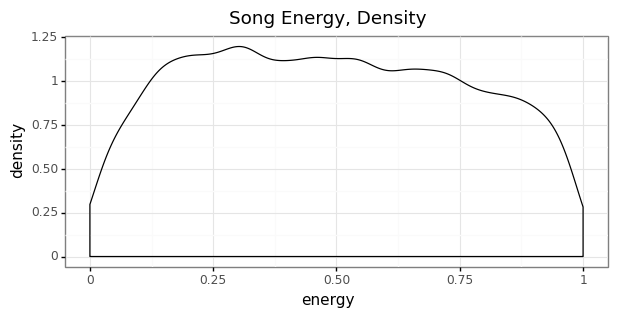

<ggplot: (323057981)>

In [10]:

output_notebook() 

(
    ggplot(plotset, aes(x='energy'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Energy, Density")
)

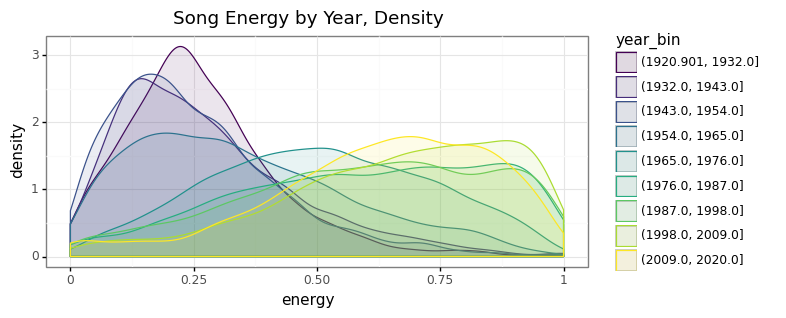

<ggplot: (325211933)>

In [11]:

(
    ggplot(plotset, aes(x='energy', color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Energy by Year, Density")
)


## Duration

This one has a nice long tail.

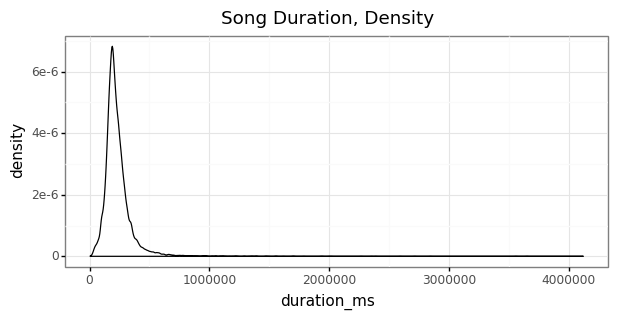

<ggplot: (325432221)>

In [12]:
(
    ggplot(plotset, aes(x='duration_ms'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Duration, Density")
)


## Acousticness

Bimodal distribution- just what we want.

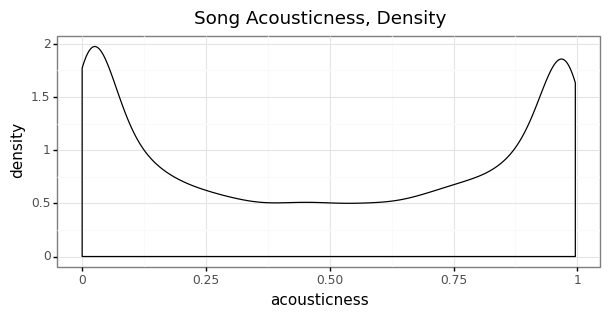

<ggplot: (325434521)>

In [13]:
(
    ggplot(plotset, aes(x='acousticness'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Acousticness, Density")
)

## Speechiness

Long tail, also good.

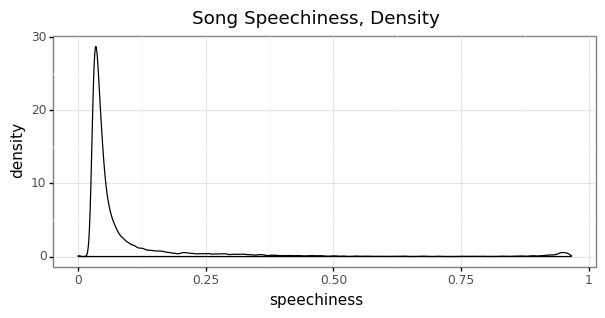

<ggplot: (323050429)>

In [14]:
(
    ggplot(plotset, aes(x='speechiness'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Speechiness, Density")
)

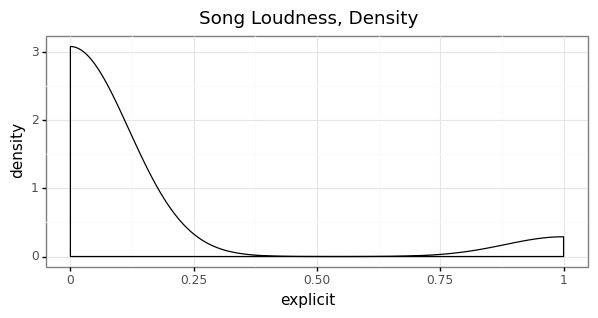

<ggplot: (325503281)>

In [15]:
(
    ggplot(plotset, aes(x='explicit'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Loudness, Density")
)

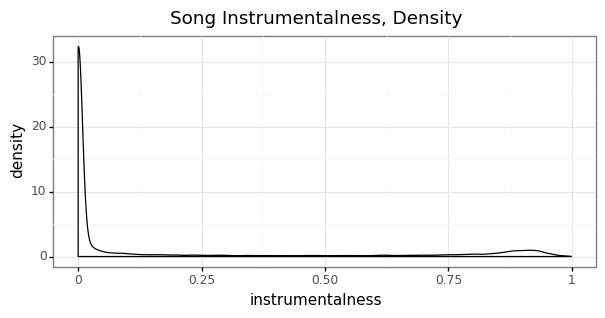

<ggplot: (325544797)>

In [16]:
(
    ggplot(plotset, aes(x='instrumentalness'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Instrumentalness, Density")
)

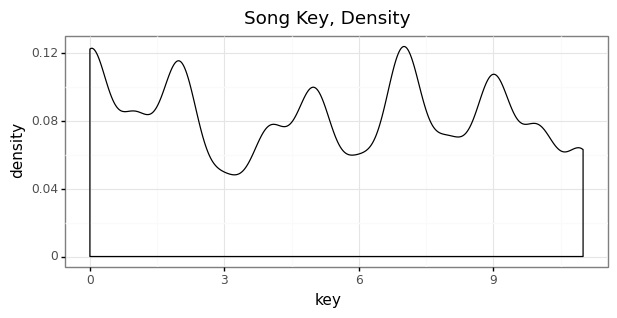

<ggplot: (325593817)>

In [17]:
(
    ggplot(plotset, aes(x='key'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Key, Density")
)

/Users/skirmer/Library/Python/3.7/lib/python/site-packages/plotnine/layer.py:372: PlotnineWarning: stat_density : Removed 4 rows containing non-finite values.


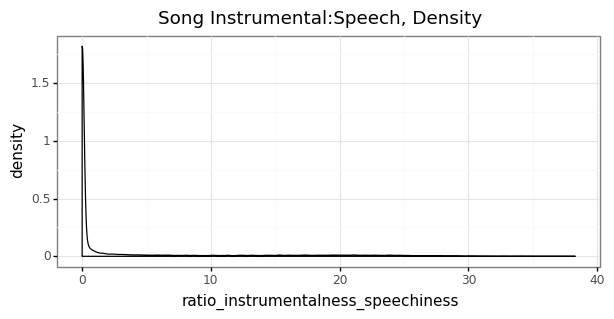

<ggplot: (325602509)>

In [18]:
(
    ggplot(plotset, aes(x='ratio_instrumentalness_speechiness'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Instrumental:Speech, Density")
)

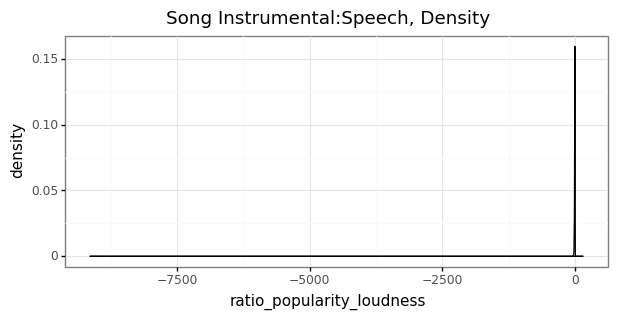

<ggplot: (325476341)>

In [19]:
(
    ggplot(plotset, aes(x='ratio_popularity_loudness'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Instrumental:Speech, Density")
)


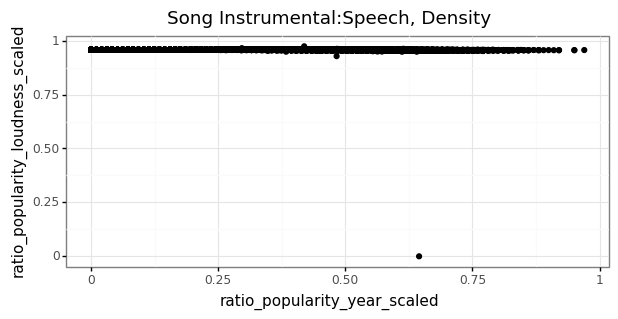

<ggplot: (325578209)>

In [20]:
(
    ggplot(plotset, aes(x='ratio_popularity_year_scaled',
                        y='ratio_popularity_loudness_scaled'))#, color='year_bin', fill='year_bin'))
    + theme_bw()
    + geom_point()
    +labs(title = "Song Instrumental:Speech, Density")
)

Features that don't seem as useful: 
* danceability 
* energy 
* valence

In [21]:
plotset.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year', 'ratio_energy_acousticness',
       'ratio_loudness_acousticness', 'ratio_popularity_tempo',
       'ratio_popularity_loudness', 'ratio_popularity_year',
       'ratio_instrumentalness_speechiness', 'acousticness_scaled',
       'danceability_scaled', 'duration_ms_scaled', 'energy_scaled',
       'explicit_scaled', 'instrumentalness_scaled', 'key_scaled',
       'liveness_scaled', 'loudness_scaled', 'mode_scaled',
       'popularity_scaled', 'speechiness_scaled', 'tempo_scaled',
       'valence_scaled', 'year_scaled', 'ratio_energy_acousticness_scaled',
       'ratio_loudness_acousticness_scaled', 'ratio_popularity_tempo_scaled',
       'ratio_popularity_loudness_scaled', 'ratio_popularity_year_scaled',
       'ratio_instrumentalness_sp

In [22]:
features = ['acousticness', 'explicit', 'duration_ms', 'ratio_instrumentalness_speechiness',
            'ratio_popularity_tempo','ratio_popularity_loudness','ratio_popularity_year',
            'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity',
            'speechiness', 'tempo', 'year']


# Model Training

In [23]:

def fit_model(dataframe, feature_list):
    ''' Accepts dataframe and list of features to be used in model training. 
    Returns trained model object and dataset with NAs removed and anomalousness 
    features appended. '''
    rng = np.random.RandomState(42)
    nd = dataframe.dropna()
    #nd = dataframe.fillna(value=0)
    X_train2 = nd.loc[:,feature_list]
    clf = IsolationForest(n_estimators=100, max_features=4,
                          contamination=.01, random_state=rng)
    clf.fit(X_train2)
    decfn = clf.decision_function(X_train2)
    scores = clf.score_samples(X_train2) 

    y_pred_train = clf.predict(X_train2)
    X_train2.loc[:,'preds'] = y_pred_train
    X_train2.loc[:,'preds_txt'] = X_train2.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})

    X_train2.loc[:,'decision_fn'] = decfn
    X_train2.loc[:,'scores'] = scores
    X_train2.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    return(clf, X_train2)


In [24]:

def predict_on_new(newdata, feature_list, modelobj):
    ''' Accepts dataframe, trained model object, and list of features required by model. 
    Returns dataset with NAs removed and anomalousness features appended. '''
    nd = newdata.dropna()
#     #newdata.fillna(value=0, inplace=True)
    dataframe = nd.loc[:, feature_list]
    decfn = modelobj.decision_function(dataframe)
    scores = modelobj.score_samples(dataframe)

    y_pred_test = modelobj.predict(dataframe)
    dataframe.loc[:,'preds'] = y_pred_test
    dataframe.loc[:,'preds_txt'] = dataframe.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})

    dataframe.loc[:,'decision_fn'] = decfn
    dataframe.loc[:,'scores'] = scores
    dataframe.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    
    return(dataframe)

In [25]:

X_train, X_test = train_test_split(dataset2, test_size=0.3)


In [26]:
modobj, new_X_train= fit_model(X_train, features)


In [27]:
new_X_train.head()

,acousticness,explicit,duration_ms,ratio_instrumentalness_speechiness,ratio_popularity_tempo,ratio_popularity_loudness,ratio_popularity_year,instrumentalness,key,liveness,...,mode,popularity,speechiness,tempo,year,preds,preds_txt,decision_fn,scores,year_bin
18868,0.1370,0,72187,19.943820,0.295313,-1.997763,0.012710,0.710000,0,0.1180,...,1,25,0.0356,84.656,1967,1,Normal,0.063060,-0.482580,"(1965.0, 1976.0]"
143932,0.0792,0,211364,0.000000,0.699986,-14.394407,0.034705,0.000000,8,0.0893,...,1,70,0.0325,100.002,2017,1,Normal,0.048795,-0.496845,"(2009.0, 2020.0]"
12255,0.0366,0,273733,0.000000,0.370763,-3.209385,0.014639,0.000000,9,0.1800,...,0,29,0.0324,78.217,1981,1,Normal,0.105184,-0.440457,"(1976.0, 1987.0]"
17206,0.6100,1,122000,0.000000,0.000000,-0.000000,0.000000,0.000000,3,0.1200,...,1,0,0.9050,87.946,1950,1,Normal,0.043604,-0.502036,"(1943.0, 1954.0]"
4566,0.1410,0,318040,0.001508,0.259984,-1.944915,0.015617,0.000056,7,0.1350,...,0,31,0.0372,119.238,1985,1,Normal,0.110502,-0.435139,"(1976.0, 1987.0]"


# Predict on Test Holdout

In [28]:
new_X_test = predict_on_new(newdata=X_test, feature_list=features, modelobj=modobj)
new_X_test.head()

,acousticness,explicit,duration_ms,ratio_instrumentalness_speechiness,ratio_popularity_tempo,ratio_popularity_loudness,ratio_popularity_year,instrumentalness,key,liveness,...,mode,popularity,speechiness,tempo,year,preds,preds_txt,decision_fn,scores,year_bin
96860,0.000025,0,202640,0.000000,0.418533,-20.755886,0.033317,0.000000,2,0.3430,...,0,67,0.1400,160.083,2011,1,Normal,0.019091,-0.526550,"(2009.0, 2020.0]"
134030,0.000845,0,176867,0.000000,0.343972,-20.408163,0.027930,0.000000,6,0.0541,...,1,56,0.0964,162.804,2005,1,Normal,0.042185,-0.503456,"(1998.0, 2009.0]"
158427,0.002590,1,294240,0.000000,0.183428,-3.501050,0.017588,0.000000,7,0.1950,...,1,35,0.3510,190.811,1990,1,Normal,0.038687,-0.506954,"(1987.0, 1998.0]"
104708,0.000138,0,94893,0.003123,0.320602,-11.208478,0.027583,0.000228,10,0.2140,...,1,55,0.0730,171.552,1994,1,Normal,0.065554,-0.480086,"(1987.0, 1998.0]"
3860,0.457000,0,269507,14.790795,0.303730,-1.893171,0.014156,0.707000,7,0.1320,...,1,28,0.0478,92.187,1978,1,Normal,0.086160,-0.459480,"(1976.0, 1987.0]"


## Feature Importances

I'm going to use Shapley values here to evaluate which features are turning out to be most helpful in isolating our observations.

The sklearn.ensemble.iforest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.


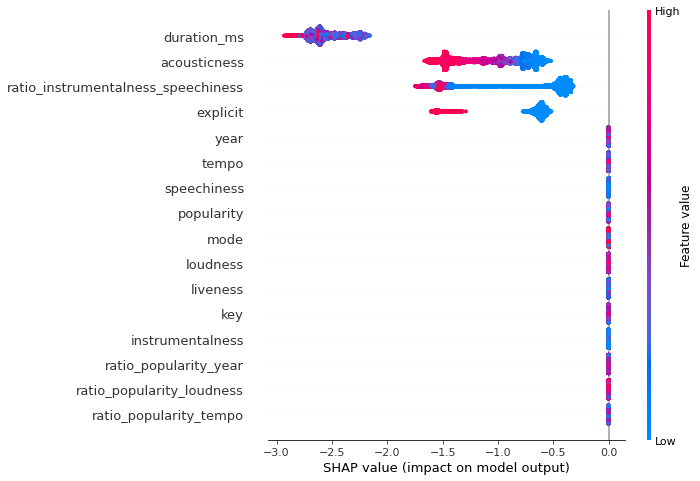

In [29]:
# Feature Importances

import shap

# Create shap values and plot them
X_explain = new_X_test.drop(['preds', 'preds_txt', 'year_bin', 'scores', 'decision_fn'], axis=1)
shap_values = shap.TreeExplainer(modobj).shap_values(X_explain)
shap.summary_plot(shap_values, X_explain)

# Analyze Predictions


In [30]:
new_X_test['preds'].value_counts(normalize=True) * 100

 1    97.107308
-1     2.892692
Name: preds, dtype: float64

In [31]:
new_X_train['preds'].value_counts(normalize=True) * 100

 1    96.999874
-1     3.000126
Name: preds, dtype: float64

In [32]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Training Sample Score", y_axis_label='Anomalousness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_train['tempo'], 
                                y=new_X_train['scores'], 
                                ur = new_X_train['preds_txt'],
                                legend_group= new_X_train['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_train.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source, fill_alpha=.5, line_alpha = .5)

# show the results
show(p)

Loading BokehJS ...

In [33]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='Anomalousness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['tempo'], 
                                y=new_X_test['scores'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source)

# show the results
show(p)

Loading BokehJS ...

In [34]:
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='Anomalousness Score', x_axis_label='Speechiness', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['speechiness'], 
                                y=new_X_test['scores'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source)

# show the results
show(p)

In [35]:
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='Instrumental : Speechiness', x_axis_label='Tempo', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['tempo'], 
                                y=new_X_test['ratio_instrumentalness_speechiness'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source)

# show the results
show(p)

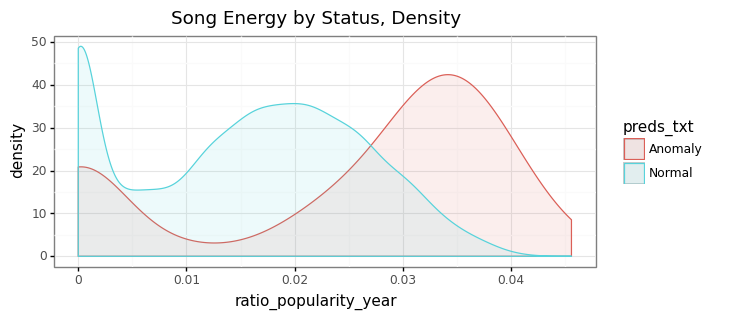

<ggplot: (332212109)>

In [45]:
plotset = new_X_test.sample(frac=0.15, replace=False, random_state=1)


(
    ggplot(plotset, aes(x='ratio_popularity_year', color='preds_txt', fill='preds_txt'))
    + theme_bw()
    + geom_density(alpha=0.1)
    +labs(title = "Song Energy by Status, Density")
)


In [36]:
features

['acousticness',
 'explicit',
 'duration_ms',
 'ratio_instrumentalness_speechiness',
 'ratio_popularity_tempo',
 'ratio_popularity_loudness',
 'ratio_popularity_year',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'popularity',
 'speechiness',
 'tempo',
 'year']

# PCA

In [59]:
plotset = plotset.reset_index()
anoms = plotset[plotset['preds_txt'] == 'Anomaly']

In [60]:
plotset.index

RangeIndex(start=0, stop=7643, step=1)

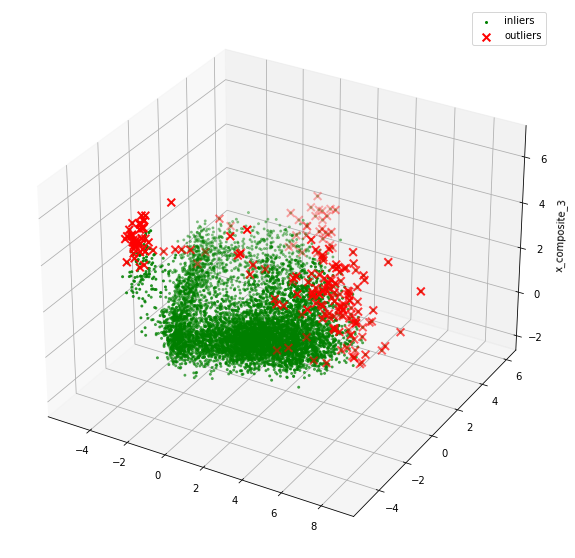

In [62]:
outlier_index=list(anoms.index)


import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
pca = PCA(n_components=3)  # Reduce to k=3 dimensions
scaler = StandardScaler()
#normalize the metrics
X = scaler.fit_transform(plotset[features])
X_reduce = pca.fit_transform(X)
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.set_zlabel("x_composite_3")
# Plot the compressed data points
ax.scatter(X_reduce[:, 0], X_reduce[:, 1], zs=X_reduce[:, 2], s=4, lw=1, label="inliers",c="green")
# Plot x's for the ground truth outliers
ax.scatter(X_reduce[outlier_index,0],X_reduce[outlier_index,1], X_reduce[outlier_index,2],
           lw=2, s=60, marker="x", c="red", label="outliers")
ax.legend()
plt.show()

In [ ]:
pd.crosstab(new_X_test['preds_txt'], new_X_test['year_bin'])


In [ ]:
anoms.head()